<a href="https://colab.research.google.com/github/namigabbasov/ai-literacy-bibliometric-analysis/blob/main/scripts/RQ3_country_productivity_and_collaboration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **RQ2 — Knowledge Creation and Collaboration**

Who are the central and productive authors, communities, and countries in AI literacy research, and how do they collaborate?

## Setup: Install and Import Required Libraries

In [1]:
resol=1000

In [2]:
!pip install -q python-louvain networkx matplotlib seaborn pandas numpy pycountry
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import os
import re
import community as community_louvain  # python-louvain
import pycountry
from itertools import combinations
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations
import community.community_louvain as community_louvain

import re, pandas as pd, numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from itertools import combinations
import community.community_louvain as community_louvain
import seaborn as sns
sns.set(style="whitegrid")


##

## Load AI Literacy Dataset from GitHub

In [3]:
url = "https://raw.githubusercontent.com/namigabbasov/ai-literacy-bibliometric-analysis/refs/heads/main/data/ai_literacy.csv"
df = pd.read_csv(url, low_memory=False)

## Author Collaboration Network

##

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import textwrap

# ==========================================
# 1. CLEAN + PREPARE AUTHOR DATA
# ==========================================

dfA = df.copy()

# Ensure citation column numeric
dfA['Cited by'] = pd.to_numeric(dfA['Cited by'], errors='coerce').fillna(0)

# Function to split authors correctly from Scopus
def split_authors_cell(x):
    if pd.isna(x):
        return []
    parts = [p.strip() for p in str(x).split(';') if p.strip()]
    return parts

# Split authors into lists
dfA['author_list'] = dfA['Authors'].apply(split_authors_cell)

# Explode into one row per author
authors_exploded = dfA.explode('author_list').rename(columns={'author_list': 'author'})

# Convert to string and strip whitespace
authors_exploded['author'] = authors_exploded['author'].astype(str).str.strip()

# Remove invalid author names
invalid_authors = ["", "nan", "none", "null", "n.a."]
authors_exploded = authors_exploded[
    ~authors_exploded['author'].str.lower().isin(invalid_authors)
]

# Count publications
author_pub_counts = (
    authors_exploded['author']
        .value_counts()
        .rename_axis('author')
        .reset_index(name='n_pubs')
)

# Select Top 10 authors
TOP_N = 10
top_authors = author_pub_counts.head(TOP_N)

# ==========================================
# 2. PLOT — Top 10 Authors by Publications
# ==========================================

plt.figure(figsize=(10, 6), dpi=resol)

# Sort values explicitly highest → lowest
top_authors_sorted = top_authors.sort_values("n_pubs", ascending=False)

# Wrap long author names
labels = [textwrap.fill(a, 30) for a in top_authors_sorted['author']]
values = top_authors_sorted['n_pubs'].values

plt.barh(labels, values, color="gray", edgecolor="black", linewidth=0.9)

# Highest bar at the top
plt.gca().invert_yaxis()

plt.title("Top 10 Authors by Number of Publications", fontsize=16, fontweight='bold')
plt.xlabel("Number of Publications", fontsize=14)
plt.ylabel("Author", fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=11)

# Give room for labels
plt.subplots_adjust(left=0.30)

plt.tight_layout()
plt.show()


In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import textwrap

# ================================
# 1. CLEAN + PREPARE DATA
# ================================

dfA = df.copy()

# Ensure citation column numeric
dfA['Cited by'] = pd.to_numeric(dfA['Cited by'], errors='coerce').fillna(0)

# Split authors safely
def split_authors(x):
    if pd.isna(x):
        return []
    return [a.strip() for a in str(x).split(';') if a.strip()]

dfA['author_list'] = dfA['Authors'].apply(split_authors)

# Explode into 1 row per author
authors_exploded = dfA.explode('author_list').rename(columns={'author_list':'author'})
authors_exploded['author'] = authors_exploded['author'].astype(str).str.strip()

# Remove invalid names
invalid = ["", "nan", "none", "null", "n.a."]
authors_exploded = authors_exploded[~authors_exploded['author'].str.lower().isin(invalid)]

# ================================
# 2. BUILD TOP AUTHORS TABLE
# ================================

# TOP_N authors by publication count
TOP_N = 10

author_pub_counts = (
    authors_exploded['author']
    .value_counts()
    .rename_axis('author')
    .reset_index(name='n_pubs')
)

top_authors = author_pub_counts.head(TOP_N)['author'].tolist()

# Author-level citation summary
author_citation_summary = (
    authors_exploded.groupby('author', as_index=False)
    .agg(
        n_pubs=('Cited by','count'),
        total_citations=('Cited by','sum'),
        mean_citations=('Cited by','mean')
    )
)

# Filter to top authors and sort by total citations
top_authors_by_cites = (
    author_citation_summary[author_citation_summary['author'].isin(top_authors)]
    .sort_values('total_citations', ascending=False)
)

# ================================
# 3. PLOT — Top Authors by Total Citations
# ================================

FIG_DPI = 300
OUT_PREFIX = "RQ2_"

plt.figure(figsize=(10,6), dpi=resol)

# Sort for clean plotting
top_cite_sorted = top_authors_by_cites.sort_values("total_citations", ascending=False)

labels = [textwrap.fill(a, 35) for a in top_cite_sorted['author']]
values = top_cite_sorted['total_citations'].values

plt.barh(labels, values, color='gray', edgecolor='black', linewidth=0.9)

# Highest at top
plt.gca().invert_yaxis()

plt.title(f"Top {TOP_N} Authors by Total Citations", fontsize=14, weight='bold')
plt.xlabel("Total Citations", fontsize=12)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)

plt.subplots_adjust(left=0.30)
plt.tight_layout()

plt.savefig(f"{OUT_PREFIX}top_authors_total_citations.png", bbox_inches='tight')
plt.show()



In [6]:
# ================================
# PLOT C — Cumulative Publications Over Time (Top Authors)
# ================================

dfA = df.copy()

# Clean year
dfA['Year'] = pd.to_numeric(dfA['Year'], errors='coerce')

# Split authors
def split_authors(x):
    if pd.isna(x):
        return []
    return [a.strip() for a in str(x).split(';') if a.strip()]

dfA['author_list'] = dfA['Authors'].apply(split_authors)

# Explode
author_year = dfA[['Year','author_list']].explode('author_list')
author_year['author'] = author_year['author_list'].astype(str).str.strip()

# Remove invalid authors
invalid = ["", "nan", "none", "null", "n.a."]
author_year = author_year[~author_year['author'].str.lower().isin(invalid)]

# Pick top authors (from earlier step)
# IMPORTANT FIX:
topN_list = top_authors          # <--- this fixes your error

# Count publications per author per year
author_year_counts = (
    author_year.groupby(['author','Year'])
               .size()
               .reset_index(name='count')
)

# Keep only top authors
plot_df = author_year_counts[author_year_counts['author'].isin(topN_list)]

# Pivot to wide format
pivot = plot_df.pivot_table(
    index='Year',
    columns='author',
    values='count',
    fill_value=0
).sort_index()

# Cumulative publications per author
pivot_cum = pivot.cumsum()

# Plot
plt.figure(figsize=(10,6), dpi=resol)

for col in pivot_cum.columns:
    plt.plot(
        pivot_cum.index,
        pivot_cum[col],
        marker='o',
        linewidth=2,
        label=col
    )

plt.title("Cumulative Publications Over Time — Top Authors", fontsize=14, weight='bold')
plt.xlabel("Year", fontsize=12)
plt.ylabel("Cumulative Publications", fontsize=12)

plt.legend(loc='upper left', fontsize=9)
plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import textwrap

# ====================================
# 1. PREPARE CLEAN AUTHOR/YEAR DATA
# ====================================

dfR = df.copy()

# Clean citations and year
dfR['Cited by'] = pd.to_numeric(dfR['Cited by'], errors='coerce').fillna(0)
dfR['Year'] = pd.to_numeric(dfR['Year'], errors='coerce')

# Split authors
def split_authors(x):
    if pd.isna(x):
        return []
    return [a.strip() for a in str(x).split(';') if a.strip()]

dfR['author_list'] = dfR['Authors'].apply(split_authors)

# Explode into one row per author per paper
exploded = dfR.explode('author_list').rename(columns={'author_list':'author'})
exploded['author'] = exploded['author'].astype(str).str.strip()

# Remove invalid author names
invalid_authors = ["", "nan", "none", "null", "n.a."]
exploded = exploded[~exploded['author'].str.lower().isin(invalid_authors)]

# Count total productivity of each author
author_productivity = exploded['author'].value_counts()

# Select top 20 authors
TOP_N = 20
top_authors = list(author_productivity.head(TOP_N).index)

exp_top = exploded[exploded['author'].isin(top_authors)]


# ====================================
# 2. BUILD AUTHOR–YEAR TABLE
# ====================================

# Count publications per author per year
count_table = (
    exp_top.groupby(['author','Year'])
           .size()
           .reset_index(name='n_pubs')
)

# Sum citations per author per year
cite_table = (
    exp_top.groupby(['author','Year'])['Cited by']
           .sum()
           .reset_index(name='total_cites')
)

# Merge counts + citations
merged = pd.merge(count_table, cite_table, on=['author','Year'], how='left')


# ====================================
# 3. ORDER AUTHORS (BEST AT TOP)
# ====================================

# Sort from MOST productive → least productive,
# then REVERSE list so most productive plots at TOP for scatter
author_order = (
    author_productivity.loc[top_authors]
    .sort_values(ascending=False)
    .index
    .tolist()[::-1]     # <<< KEY FIX: reverse the list
)

# Map each author to a numeric y-position
author_to_y = {author: i for i, author in enumerate(author_order)}
merged['y'] = merged['author'].map(author_to_y)

# Add spacing so lines don't overlap
spacing_factor = 1.3
merged['y_spaced'] = merged['y'] * spacing_factor


# ====================================
# 4. BUBBLE SIZE SCALING
# ====================================

SIZE_SCALE = 120
merged['size'] = merged['n_pubs'] * SIZE_SCALE


# ====================================
# 5. PLOT SETTINGS
# ====================================

FIG_WIDTH = 12
FIG_HEIGHT = 12
TEXT_SIZE = 14
LABEL_SIZE = 12
TITLE_SIZE = 20
LEGEND_SIZE = 12

plt.figure(figsize=(FIG_WIDTH, FIG_HEIGHT), dpi=resol)


# ====================================
# 6. MAIN SCATTER PLOT
# ====================================

plt.scatter(
    merged['Year'],
    merged['y_spaced'],
    s=merged['size'],
    c=merged['total_cites'],
    cmap='Reds',        # use 'Greys' for grayscale
    alpha=0.8,
    edgecolor='black'
)


# ====================================
# 7. FIXED: CORRECT Y-AXIS ORDERING
# ====================================

sorted_y = sorted(merged['y_spaced'].unique())
y_labels = [author_order[int(y/spacing_factor)] for y in sorted_y]

plt.yticks(
    sorted_y,
    [textwrap.fill(a, 40) for a in y_labels],
    fontsize=LABEL_SIZE
)


# ====================================
# 8. AXIS LABELS & TITLE
# ====================================

plt.xticks(sorted(merged['Year'].unique()), fontsize=LABEL_SIZE)
plt.xlabel("Year", fontsize=TEXT_SIZE)
plt.ylabel("Author (ordered by total productivity)", fontsize=TEXT_SIZE)

plt.title("Most Productive Authors' Production Over Time",
          fontsize=TITLE_SIZE, fontweight='bold')

plt.grid(alpha=0.3)


# ====================================
# 9. COLORBAR (CITATIONS)
# ====================================

cbar = plt.colorbar()
cbar.set_label("Citations", fontsize=TEXT_SIZE)


# ====================================
# 10. FULL BUBBLE SIZE LEGEND (1–13)
# ====================================

unique_pubs = sorted(merged['n_pubs'].unique())   # e.g., [1..13]

size_legend_handles = []
for p in unique_pubs:
    size_legend_handles.append(
        plt.scatter([], [],
                    s=p * SIZE_SCALE,
                    color='gray',
                    edgecolor='black',
                    label=str(p))     # only the number
    )

plt.legend(
    handles=size_legend_handles,
    title="Number of articles per year",
    scatterpoints=1,
    fontsize=LEGEND_SIZE,
    title_fontsize=LEGEND_SIZE,
    loc='upper center',
    bbox_to_anchor=(0.5, -0.06),
    ncol=len(unique_pubs),     # 13 circles in one row
    frameon=False
)

plt.tight_layout()
plt.show()


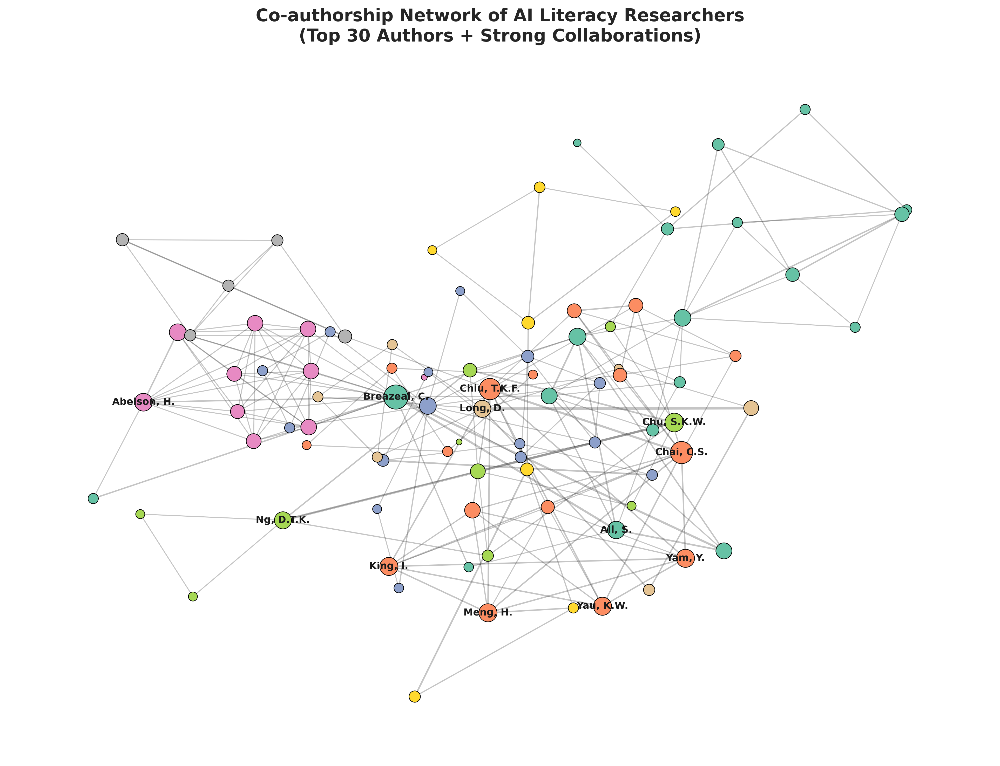

Top central authors by weighted degree:
Breazeal, C.: 47
Chai, C.S.: 39
Chiu, T.K.F.: 36
Chu, S.K.W.: 27
King, I.: 25
Meng, H.: 25
Yau, K.W.: 25
Yam, Y.: 25
Abelson, H.: 24
Ali, S.: 23
Ng, D.T.K.: 22
Long, D.: 22


In [8]:
# ============================================================
# RQ2 — CLEAN Co-authorship Network (Top 30 authors + strong ties)
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import itertools
from networkx.algorithms import community

# ------------------------------------------------------------
# 1. PREPARE CLEAN AUTHOR DATA
# ------------------------------------------------------------

dfN = df.copy()
dfN['Cited by'] = pd.to_numeric(dfN['Cited by'], errors='coerce').fillna(0)

def split_authors(x):
    if isinstance(x, list):
        return x
    if pd.isna(x):
        return []
    return [a.strip() for a in str(x).split(';') if a.strip()]

dfN['author_list'] = dfN['Authors'].apply(split_authors)

invalid = ["", "nan", "none", "null", "n.a."]

explodedN = dfN.explode('author_list')
explodedN['author_list'] = explodedN['author_list'].astype(str).str.strip()
explodedN = explodedN[~explodedN['author_list'].str.lower().isin(invalid)]

author_prod = explodedN['author_list'].value_counts()

# ⭐ EXPANDED CORE AUTHORS
TOP_N = 30
core_authors = set(author_prod.head(TOP_N).index)

# Filter papers containing at least one core author
df_core = dfN[
    dfN['author_list'].apply(
        lambda lst: any(a in core_authors for a in (lst if isinstance(lst, list) else split_authors(lst)))
    )
]

# ------------------------------------------------------------
# 2. BUILD WEIGHTED CO-AUTHORSHIP NETWORK
# ------------------------------------------------------------

G = nx.Graph()
edge_weights = {}

for _, row in df_core.iterrows():
    authors = row['author_list']
    authors = [a for a in authors if a.lower() not in invalid]
    authors = list(set(authors))

    for a in authors:
        G.add_node(a)

    for a, b in itertools.combinations(authors, 2):
        edge_weights[(a, b)] = edge_weights.get((a, b), 0) + 1

# ------------------------------------------------------------
# 3. PRUNE EDGES (KEEP ONLY STRONG TIES)
# ------------------------------------------------------------

strong_edges = {(a,b): w for (a,b),w in edge_weights.items() if w >= 2}

G = nx.Graph()
for (a,b), w in strong_edges.items():
    G.add_edge(a, b, weight=w)

# Remove weak nodes (degree < 2)
weak_nodes = [n for n,d in G.degree() if d < 2]
G.remove_nodes_from(weak_nodes)

# ------------------------------------------------------------
# 4. CENTRALITY & COMMUNITIES
# ------------------------------------------------------------

strength = dict(G.degree(weight='weight'))
communities = community.greedy_modularity_communities(G, weight='weight')

comm_map = {}
for i, comm in enumerate(communities):
    for n in comm:
        comm_map[n] = i

# ------------------------------------------------------------
# 5. LAYOUT + DRAW
# ------------------------------------------------------------

plt.figure(figsize=(13, 10), dpi=300)

pos = nx.kamada_kawai_layout(G)

node_sizes = [30 + 10*strength[n] for n in G.nodes()]

cmap = plt.cm.Set2
node_colors = [cmap(comm_map[n] % cmap.N) for n in G.nodes()]

weights = [G[u][v]['weight'] for u,v in G.edges()]
max_w = max(weights) if weights else 1
edge_widths = [0.5 + 2*(w/max_w) for w in weights]

nx.draw_networkx_edges(G, pos, width=edge_widths, alpha=0.25)
nx.draw_networkx_nodes(G, pos,
                       node_size=node_sizes,
                       node_color=node_colors,
                       edgecolors='black',
                       linewidths=0.6)

# Label top 12 most central authors
top12 = sorted(strength.items(), key=lambda x: x[1], reverse=True)[:12]
top12_names = [a for a,_ in top12]

labels = {n: (n if n in top12_names else "") for n in G.nodes()}
nx.draw_networkx_labels(G, pos, labels=labels,
                        font_size=9, font_weight="bold")

plt.title("Co-authorship Network of AI Literacy Researchers\n(Top 30 Authors + Strong Collaborations)",
          fontsize=16, fontweight='bold')

plt.axis("off")
plt.tight_layout()
plt.show()

print("Top central authors by weighted degree:")
for a, s in top12:
    print(f"{a}: {s}")


## Countries

In [9]:
# ============================================================
# EXTRACT COUNTRIES FROM AFFILIATIONS
# ============================================================

dfC = df.copy()

def extract_countries(affil):
    if pd.isna(affil):
        return []
    parts = [p.strip() for p in str(affil).split(';') if p.strip()]
    countries = []
    for p in parts:
        # Extract last comma-separated token
        match = p.split(',')[-1].strip()
        if match and match.lower() not in ["nan", "none", "null"]:
            countries.append(match)
    return list(set(countries))  # unique

dfC["country_list"] = dfC["Affiliations"].apply(extract_countries)

# explode for country counts
country_exploded = dfC.explode("country_list")
country_exploded = country_exploded[country_exploded["country_list"].notna()]


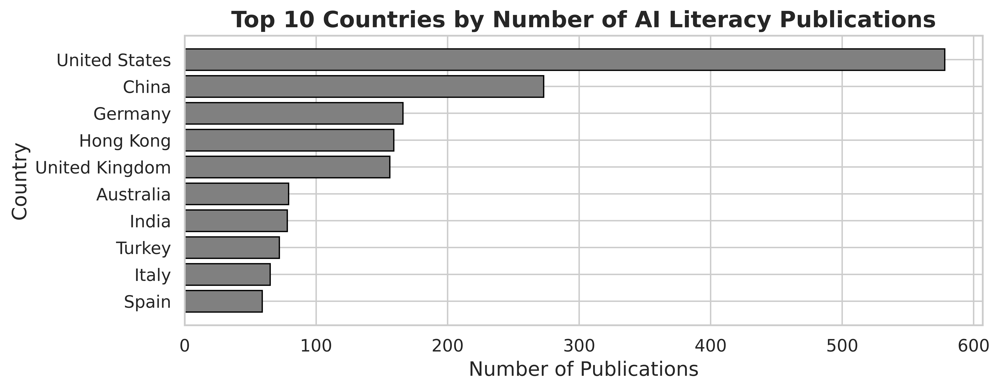

In [10]:
# ============================================================
# TOP 10 COUNTRIES BY PUBLICATION COUNT
# ============================================================

top_countries = (
    country_exploded["country_list"]
    .value_counts()
    .head(10)
    .rename_axis("Country")
    .reset_index(name="Publications")
)

plt.figure(figsize=(10,4), dpi=resol)

plt.barh(
    top_countries["Country"],
    top_countries["Publications"],
    color="gray",
    edgecolor="black",
    linewidth=0.9
)

plt.gca().invert_yaxis()
plt.title("Top 10 Countries by Number of AI Literacy Publications", fontsize=16, weight="bold")
plt.xlabel("Number of Publications", fontsize=14)
plt.ylabel("Country", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.subplots_adjust(left=0.28)
plt.tight_layout()
plt.show()


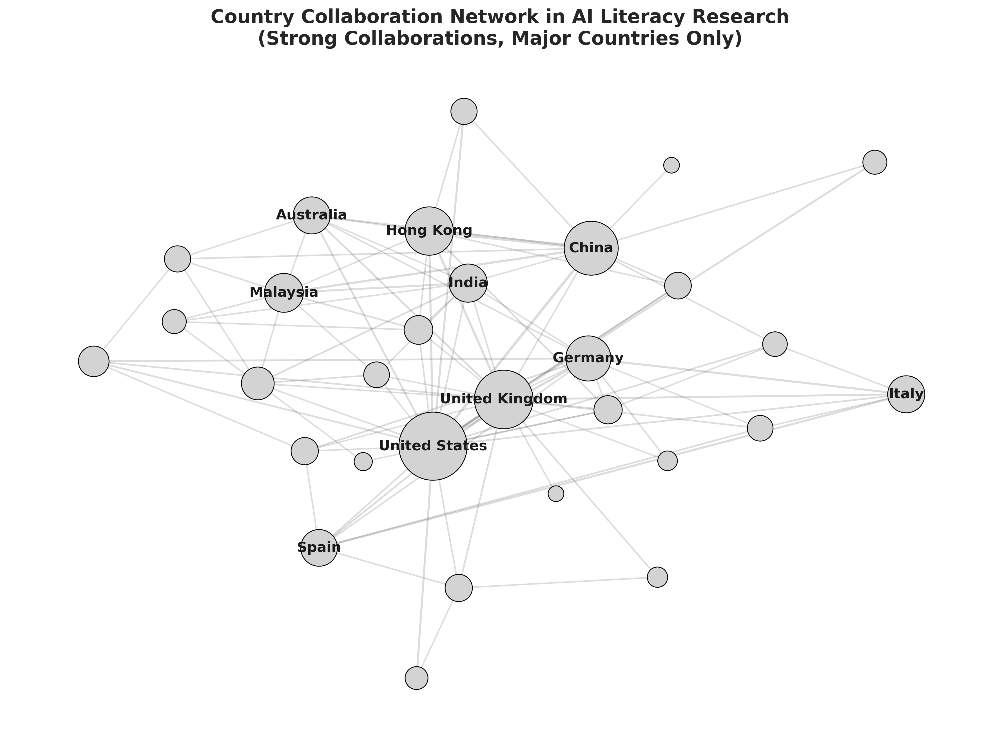

Top collaborative countries: [('United States', 163), ('United Kingdom', 119), ('China', 100), ('Hong Kong', 79), ('Germany', 68), ('Malaysia', 49), ('India', 47), ('Australia', 44), ('Italy', 44), ('Spain', 43)]


In [11]:
# ============================================================
# CLEAN, PUBLICATION-READY COUNTRY COLLABORATION NETWORK
# (Strong ties only, major countries only)
# ============================================================

import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
import networkx as nx

dfC = df.copy()

def extract_countries(affil):
    if pd.isna(affil): return []
    parts = [p.strip() for p in str(affil).split(";") if p.strip()]
    countries = []
    for p in parts:
        c = p.split(",")[-1].strip()
        if c.lower() not in ["nan","none","null"]:
            countries.append(c)
    return list(set(countries))

dfC["country_list"] = dfC["Affiliations"].apply(extract_countries)

# explode for counts
country_exploded = dfC.explode("country_list")
country_counts = country_exploded["country_list"].value_counts()

# ============================================================
# 1. KEEP ONLY MAJOR COUNTRIES (>= 20 PUBLICATIONS)
# ============================================================

MAJOR_THRESHOLD = 20
major_countries = set(country_counts[country_counts >= MAJOR_THRESHOLD].index)

dfC_major = dfC[dfC["country_list"].apply(
    lambda lst: any(c in major_countries for c in lst)
)]

# ============================================================
# 2. BUILD STRONG COLLABORATION NETWORK (edges >= 3)
# ============================================================

G_country = nx.Graph()
edge_weights = {}

for _, row in dfC_major.iterrows():
    clist = [c for c in row["country_list"] if c in major_countries]
    if len(clist) < 2:
        continue
    for a, b in itertools.combinations(set(clist), 2):
        edge_weights[(a,b)] = edge_weights.get((a,b), 0) + 1

# keep strong edges ONLY
STRONG_EDGE = 3
G_country = nx.Graph()
for (a,b), w in edge_weights.items():
    if w >= STRONG_EDGE:
        G_country.add_edge(a, b, weight=w)

# prune isolated nodes
isol = [n for n,d in G_country.degree() if d == 0]
G_country.remove_nodes_from(isol)

# ============================================================
# 3. STRENGTH + NODE SIZE
# ============================================================

strength = dict(G_country.degree(weight="weight"))
node_sizes = [120 + 20*strength[n] for n in G_country.nodes()]

# ============================================================
# 4. LAYOUT
# ============================================================

pos = nx.kamada_kawai_layout(G_country)

# edge widths
weights = [G_country[u][v]["weight"] for u,v in G_country.edges()]
max_w = max(weights) if weights else 1
edge_widths = [1 + 2*(w/max_w) for w in weights]

# ============================================================
# 5. DRAW NETWORK
# ============================================================

plt.figure(figsize=(12,9), dpi=300)

nx.draw_networkx_edges(G_country, pos, width=edge_widths, alpha=0.15)

nx.draw_networkx_nodes(
    G_country, pos,
    node_size=node_sizes,
    node_color="lightgray",
    edgecolors="black",
    linewidths=0.7
)

# Label only top 8–10 countries
top_strength = sorted(strength.items(), key=lambda x: x[1], reverse=True)[:10]
labelset = set([a for a, _ in top_strength])
labels = {n: (n if n in labelset else "") for n in G_country.nodes()}

nx.draw_networkx_labels(G_country, pos, labels=labels,
                        font_size=12, font_weight="bold")

plt.title("Country Collaboration Network in AI Literacy Research\n(Strong Collaborations, Major Countries Only)",
          fontsize=16, fontweight="bold")
plt.axis("off")
plt.tight_layout()
plt.show()

print("Top collaborative countries:", top_strength)


In [12]:
!pip install -q geodatasets geopandas

In [13]:
import pandas as pd

# Copy to avoid modifying original
dfC = df.copy()

# --------- 1. Function to extract country names ---------
def extract_countries(affil):
    """Extracts last comma-separated token from each affiliation block."""
    if pd.isna(affil):
        return []
    parts = [p.strip() for p in str(affil).split(";") if p.strip()]
    countries = []
    for p in parts:
        # take last segment after comma
        country = p.split(",")[-1].strip()
        if country and country.lower() not in ["nan", "null", "none"]:
            countries.append(country)
    return list(set(countries))   # remove duplicates inside each cell

# --------- 2. Apply extraction ---------
dfC["country_list"] = dfC["Affiliations"].apply(extract_countries)

# --------- 3. Build a master list of countries ---------
all_countries = (
    dfC["country_list"]
    .explode()
    .dropna()
    .unique()
)

all_countries = sorted(all_countries)

# Print them nicely
for c in all_countries:
    print(c)

print("\nTotal unique extracted country names:", len(all_countries))


Afghanistan
Albania
Algeria
Argentina
Armenia
Australia
Austria
Azerbaijan
Bahrain
Bangladesh
Belgium
Bosnia and Herzegovina
Botswana
Brazil
Brunei Darussalam
Bulgaria
Cambodia
Cameroon
Canada
Cape Verde
Chile
China
Colombia
Costa Rica
Croatia
Cyprus
Czech Republic
Denmark
Ecuador
Egypt
Estonia
Finland
France
Georgia
Germany
Ghana
Greece
Guatemala
Hong Kong
Hungary
India
Indonesia
Iran
Iraq
Ireland
Israel
Italy
Jamaica
Japan
Jordan
Kazakhstan
Kenya
Kuwait
Laos
Latvia
Lebanon
Lesotho
Lithuania
Luxembourg
Macao
Malawi
Malaysia
Maldives
Malta
Mauritius
Mexico
Moldova
Morocco
Mozambique
Nepal
Netherlands
New Zealand
Nigeria
North Macedonia
Norway
Oman
Pakistan
Palestine
Peru
Philippines
Poland
Portugal
Puerto Rico
Qatar
ReadyAI
Romania
Russian Federation
Rwanda
Saint Kitts and Nevis
Saudi Arabia
Serbia
Singapore
Slovakia
Slovenia
South Africa
South Korea
Spain
Sri Lanka
Sudan
Sweden
Switzerland
Taiwan
Tanzania
Thailand
Trinidad and Tobago
Tunisia
Turkey
Uganda
Ukraine
United Arab Emirates


In [14]:
import geodatasets as gd
import inspect

print("gd.data type:", type(gd.data))
print("gd.data attributes:", dir(gd.data))






gd.data type: <class 'geodatasets.lib.Bunch'>
gd.data attributes: ['abs', 'eea', 'geoda', 'naturalearth', 'ny']


In [15]:
import geodatasets as gd
print(gd.data.__dict__.keys())


dict_keys([])


In [16]:
!pip install geopandas


In [17]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Natural Earth Admin 0 – Countries (HTTP download)
world = gpd.read_file(
    "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
)

world.head()


,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,...,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Admin-0 country,1,2,Canada,CAN,0,2,Sovereign country,1,Canada,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,Admin-0 country,1,2,United States of America,US1,1,2,Country,1,United States of America,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."


In [30]:
# ============================================================
# FULL CLEAN PIPELINE — RUN THIS AS ONE BLOCK (NO ERRORS)
# ============================================================

import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# ---------------------------
# 1. Extract countries fresh
# ---------------------------
def extract_countries(affil):
    if pd.isna(affil):
        return []
    parts = [p.strip() for p in str(affil).split(";") if p.strip()]
    out = []
    for p in parts:
        c = p.split(",")[-1].strip()
        if c and c.lower() not in ["nan","none","null","","animacy"]:
            out.append(c)
    return list(set(out))

dfC = df.copy()
dfC["country_list"] = dfC["Affiliations"].apply(extract_countries)

country_exploded = dfC.explode("country_list")
country_exploded = country_exploded[country_exploded["country_list"].notna()]

country_counts = (
    country_exploded["country_list"]
    .value_counts()
    .rename_axis("Country")
    .reset_index(name="Publications")
)

# ---------------------------
# 2. Mapping dictionary
# ---------------------------
country_name_map = {
    "Afghanistan":"Afghanistan","Albania":"Albania","Algeria":"Algeria","Argentina":"Argentina",
    "Armenia":"Armenia","Australia":"Australia","Austria":"Austria","Azerbaijan":"Azerbaijan",
    "Bahrain":"Bahrain","Bangladesh":"Bangladesh","Belgium":"Belgium",
    "Bosnia and Herzegovina":"Bosnia and Herzegovina","Botswana":"Botswana","Brazil":"Brazil",
    "Brunei Darussalam":"Brunei","Bulgaria":"Bulgaria","Cambodia":"Cambodia","Cameroon":"Cameroon",
    "Canada":"Canada","Cape Verde":"Cabo Verde","Chile":"Chile","China":"China","Colombia":"Colombia",
    "Costa Rica":"Costa Rica","Croatia":"Croatia","Cyprus":"Cyprus","Czech Republic":"Czechia",
    "Denmark":"Denmark","Ecuador":"Ecuador","Egypt":"Egypt","Estonia":"Estonia","Finland":"Finland",
    "France":"France","Georgia":"Georgia","Germany":"Germany","Ghana":"Ghana","Greece":"Greece",
    "Guatemala":"Guatemala","Hong Kong":"Hong Kong","Hungary":"Hungary","India":"India",
    "Indonesia":"Indonesia","Iran":"Iran","Iraq":"Iraq","Ireland":"Ireland","Israel":"Israel",
    "Italy":"Italy","Jamaica":"Jamaica","Japan":"Japan","Jordan":"Jordan","Kazakhstan":"Kazakhstan",
    "Kenya":"Kenya","Kuwait":"Kuwait","Laos":"Lao PDR","Latvia":"Latvia","Lebanon":"Lebanon",
    "Lesotho":"Lesotho","Lithuania":"Lithuania","Luxembourg":"Luxembourg","Macao":"Macau",
    "Malawi":"Malawi","Malaysia":"Malaysia","Maldives":"Maldives","Malta":"Malta",
    "Mauritius":"Mauritius","Mexico":"Mexico","Moldova":"Moldova","Morocco":"Morocco",
    "Mozambique":"Mozambique","Nepal":"Nepal","Netherlands":"Netherlands","New Zealand":"New Zealand",
    "Nigeria":"Nigeria","North Macedonia":"North Macedonia","Norway":"Norway","Oman":"Oman",
    "Pakistan":"Pakistan","Palestine":"Palestine","Peru":"Peru","Philippines":"Philippines",
    "Poland":"Poland","Portugal":"Portugal","Puerto Rico":None,"Qatar":"Qatar",
    "Romania":"Romania","Russian Federation":"Russia","Rwanda":"Rwanda",
    "Saint Kitts and Nevis":"Saint Kitts and Nevis","Saudi Arabia":"Saudi Arabia","Serbia":"Serbia",
    "Singapore":"Singapore","Slovakia":"Slovakia","Slovenia":"Slovenia","South Africa":"South Africa",
    "South Korea":"South Korea","Spain":"Spain","Sri Lanka":"Sri Lanka","Sudan":"Sudan",
    "Sweden":"Sweden","Switzerland":"Switzerland","Taiwan":None,"Tanzania":"Tanzania",
    "Thailand":"Thailand","Trinidad and Tobago":"Trinidad and Tobago","Tunisia":"Tunisia",
    "Turkey":"Türkiye","Uganda":"Uganda","Ukraine":"Ukraine",
    "United Arab Emirates":"United Arab Emirates",
    "United Kingdom":"United Kingdom",
    "United States":"United States of America",
    "Uruguay":"Uruguay","Uzbekistan":"Uzbekistan","Viet Nam":"Vietnam","Zambia":"Zambia",
    "Zimbabwe":"Zimbabwe"
}

# ---------------------------
# 3. Apply mapping CLEANLY
# ---------------------------
country_counts["Country_NE"] = country_counts["Country"].map(country_name_map)
country_counts = country_counts[country_counts["Country_NE"].notna()]

# ---------------------------
# 4. Load Natural Earth world map
# ---------------------------
world = gpd.read_file(
    "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
)

# ---------------------------
# 5. Merge and PLOT (no errors!)
# ---------------------------

merged = world.merge(
    country_counts,
    left_on="NAME",
    right_on="Country_NE",
    how="left"
)

merged["Publications"] = merged["Publications"].fillna(0)

fig, ax = plt.subplots(figsize=(12,8), dpi=1000)

merged.plot(
    column="Publications",
    cmap="Blues",
    linewidth=0.4,
    edgecolor="black",
    ax=ax,
    legend=True,
    legend_kwds={
        "label": "Number of AI Literacy Publications",
        "orientation": "vertical",
        "shrink": 0.5
    }
)

ax.set_title("Global Distribution of AI Literacy Publications",
             fontsize=26, fontweight="bold", pad=20)
ax.set_axis_off()

plt.tight_layout()
plt.show()


In [22]:
import pandas as pd

# -----------------------------------------
# 1. Rebuild country list for each paper
# -----------------------------------------
def extract_countries(affil):
    if pd.isna(affil):
        return []
    parts = [p.strip() for p in str(affil).split(";") if p.strip()]
    out = []
    for p in parts:
        c = p.split(",")[-1].strip()
        if c.lower() not in ["nan","none","null",""]:
            out.append(c)
    return list(set(out))

df_country = df.copy()
df_country["country_list"] = df_country["Affiliations"].apply(extract_countries)

# Ensure 'Cited by' numeric
df_country["Cited by"] = pd.to_numeric(df_country["Cited by"], errors="coerce").fillna(0)

# -----------------------------------------
# 2. Build country → paper relationships
# -----------------------------------------
country_exploded = df_country.explode("country_list")
country_exploded = country_exploded[country_exploded["country_list"].notna()]

# Rename
country_exploded = country_exploded.rename(columns={"country_list": "Country"})

# -----------------------------------------
# 3. Compute Article Counts, Mean Citations, Total Citations
# -----------------------------------------
country_summary = (
    country_exploded.groupby("Country")
    .agg(
        num_articles=("EID", "count"),
        mean_citations=("Cited by", "mean"),
        total_citations=("Cited by", "sum")
    )
)

# -----------------------------------------
# 4. Compute SCP (Single Country Papers) and MCP (Multi Country Papers)
# -----------------------------------------
df_country["is_multiple_country"] = df_country["country_list"].apply(
    lambda x: len(x) > 1
)

# Count SCP and MCP per country
scp = []
mcp = []

for country in country_summary.index:
    # Papers where this country appears
    papers = df_country[df_country["country_list"].apply(lambda lst: country in lst if isinstance(lst, list) else False)]

    scp.append(sum(papers["is_multiple_country"] == False))
    mcp.append(sum(papers["is_multiple_country"] == True))

country_summary["SCP"] = scp
country_summary["MCP"] = mcp

# -----------------------------------------
# 5. Sort by # of Articles (descending)
# -----------------------------------------
country_summary = country_summary.sort_values("num_articles", ascending=False)

# -----------------------------------------
# 6. Clean up formatting (rounding)
# -----------------------------------------
country_summary["mean_citations"] = country_summary["mean_citations"].round(2)

# -----------------------------------------
# 7. Display Table 3
# -----------------------------------------
country_summary


,num_articles,mean_citations,total_citations,SCP,MCP
Country,,,,,
United States,577,14.06,8126.0,444,134
China,273,10.81,2952.0,177,96
Germany,166,15.48,2569.0,100,66
Hong Kong,159,51.10,8125.0,94,65
United Kingdom,156,9.42,1470.0,61,95
...,...,...,...,...,...
Rwanda,1,47.00,47.0,0,1
Sudan,1,0.00,0.0,1,0
Sri Lanka,1,0.00,0.0,0,1


In [26]:
# Countries with at least 20 articles
countries_20plus = country_summary[country_summary["num_articles"] >= 20]

countries_20plus
countries_20plus.to_excel("Countries_20plus_AI_Literacy.xlsx", index=True)

